# Rossmann Store Sales

<br>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
import statsmodels.api as sm
import math
import time
import warnings

from statsmodels.tsa.deterministic import Fourier, CalendarFourier, DeterministicProcess
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

%matplotlib inline

warnings.filterwarnings('ignore')

<br>

### Определение метрик и методов анализа временных рядов

[RMSPE](https://help.pecan.ai/en/articles/6456388-model-performance-metrics-for-regression-models#Modelperformancemetricsforregressionmodels-RootMeanSquaredPercentageError(RMSPE)) 
(Root Mean Square Percentage Error) метрика.<br>
Используется далее при обучении XGBoost для прогнозирования значений вместо выбросов.

In [2]:
def ToWeight(y):
    w = np.zeros(y.shape, dtype=float)
    ind = y != 0
    w[ind] = 1./(y[ind]**2)
    return w

def rmspe(yhat, y):
    w = ToWeight(y)
    rmspe = np.sqrt(np.mean( w * (y - yhat)**2 ))
    return rmspe

def rmspe_xg(yhat, y):
    y = y.get_label()
    y = np.exp(y) - 1
    yhat = np.exp(yhat) - 1
    w = ToWeight(y)
    rmspe = np.sqrt(np.mean(w * (y - yhat)**2))
    return "rmspe", rmspe

In [3]:
# вспомогательный метод для рисования графиков запаздывания (plot_lags)

def lagplot(x, y=None, lag=1, standardize=False, ax=None, **kwargs):
    from matplotlib.offsetbox import AnchoredText
    x_ = x.shift(lag)
    if standardize:
        x_ = (x_ - x_.mean()) / x_.std()
    if y is not None:
        y_ = (y - y.mean()) / y.std() if standardize else y
    else:
        y_ = x
    corr = y_.corr(x_)
    if ax is None:
        fig, ax = plt.subplots()
    scatter_kws = dict(
        alpha=0.75,
        s=3,
    )
    line_kws = dict(color='C3', )
    ax = sns.regplot(x=x_,
                     y=y_,
                     scatter_kws=scatter_kws,
                     line_kws=line_kws,
                     lowess=True,
                     ax=ax,
                     **kwargs)
    at = AnchoredText(
        f"{corr:.2f}",
        prop=dict(size="large"),
        frameon=True,
        loc="upper left",
    )
    at.patch.set_boxstyle("square, pad=0.0")
    ax.add_artist(at)
    ax.set(title=f"Lag {lag}", xlabel=x_.name, ylabel=y_.name)
    return ax


# графики запаздывания

def plot_lags(x, y=None, lags=6, nrows=1, lagplot_kwargs={}, **kwargs):

    """
    Params:
        X, y - данные
        lags - лаги, для которых будут строиться графики запаздывания
        nrows - количество выводимых строк
    """
        
    kwargs.setdefault('nrows', nrows)
    kwargs.setdefault('ncols', math.ceil(lags / nrows))
    kwargs.setdefault('figsize', (kwargs['ncols'] * 2, nrows * 2 + 0.5))
    fig, axs = plt.subplots(sharex=True, sharey=True, squeeze=False, **kwargs)
    for ax, k in zip(fig.get_axes(), range(kwargs['nrows'] * kwargs['ncols'])):
        if k + 1 <= lags:
            ax = lagplot(x, y, lag=k + 1, ax=ax, **lagplot_kwargs)
            ax.set_title(f"Lag {k + 1}", fontdict=dict(fontsize=14))
            ax.set(xlabel="", ylabel="")
        else:
            ax.axis('off')
    plt.setp(axs[-1, :], xlabel=x.name)
    plt.setp(axs[:, 0], ylabel=y.name if y is not None else x.name)
    fig.tight_layout(w_pad=0.1, h_pad=0.1)
    return fig


# сезонный график

def seasonal_plot(X, y, period, freq, ax=None):
    
    """
    Params:
        X, y - данные
        period - индикаторы сезонов
        freq - индикаторы элементов внутри сезонов (для сопоставления значений в разных сезонах)
    """
    
    if ax is None:
        _, ax = plt.subplots()
    palette = sns.color_palette("husl", n_colors=X[period].nunique(),)
    ax = sns.lineplot(
        x=freq,
        y=y,
        hue=period,
        data=X,
        ci=False,
        ax=ax,
        palette=palette,
        legend=False,
    )
    ax.set_title(f"Seasonal Plot ({period}/{freq})")
    for line, name in zip(ax.lines, X[period].unique()):
        y_ = line.get_ydata()[-1]
        ax.annotate(
            name,
            xy=(1, y_),
            xytext=(6, 0),
            color=line.get_color(),
            xycoords=ax.get_yaxis_transform(),
            textcoords="offset points",
            size=14,
            va="center",
        )
    return ax


In [4]:
# периодограмма

def plot_periodogram(ts, detrend='linear', ax=None):
    from scipy.signal import periodogram
    fs = pd.Timedelta("1Y") / pd.Timedelta("1D")
    freqencies, spectrum = periodogram(
        ts,
        fs=fs,
        detrend=detrend,
        window="boxcar",
        scaling='spectrum',
    )
    if ax is None:
        _, ax = plt.subplots()
    ax.step(freqencies, spectrum, color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(
        [
            "Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)",
        ],
        rotation=90,
    )
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    return ax


<br>

### Загрузка данных

<br>

In [5]:
train = pd.read_csv('train.csv', 
                     nrows=None,
                     parse_dates=['Date'],
                     date_parser=(lambda dt: pd.to_datetime(dt, format='%Y-%m-%d')))

test = pd.read_csv('test.csv', 
                    nrows=None,
                    parse_dates=['Date'],
                    date_parser=(lambda dt: pd.to_datetime(dt, format='%Y-%m-%d')))

stores = pd.read_csv('store.csv', nrows=None)

Файлы `train.csv`, `test.csv` и `store.csv` взяты из [Rossmann Store Sales](https://www.kaggle.com/c/rossmann-store-sales/data).

`train.csv`, `test.csv` - информация о продажах (обучающий и тестовый набор)<br>
`store.csv` - информация о магазинах

`train.csv`, `test.csv`:
- **Id** - идентификатор, представляющий пару (Store, Date) в тестовом наборе.
- **Store** - идентификатор магазина
- **Sales** - продажи в данный день (то, что нужно прогнозировать)
- **Customers** - количество клиентов в данный день 
- **Open** - был ли магазин открыт: 0 = закрыт, 1 = открыт
- **Promo** - действует ли в магазине акция в этот день: 0 = не действует, 1 = действует
- **StateHoliday** - бы ли в данный день государственный праздник. <br>
  Обычно все магазины, за редким исключением, закрыты в   
  государственные праздники. Обратите внимание, что все школы закрыты в праздничные и выходные дни.<br> 
  a = государственный праздник, b = праздник Пасхи, c = Рождество, 0 = нет
- **SchoolHoliday** - указывает, повлияло ли на пару (Store, Date) закрытие государственных школ.


`store.csv`: 
- **StoreType** - модель магазина: a, b, c, d.
- **Assortment** - тип ассортимента: a = базовый, b = дополнительный, c = расширенный
- **CompetitionDistance** - расстояние в метрах до ближайшего магазина конкурента
- **CompetitionOpenSince[Month/Year]** - примерный год и месяц открытия ближайшего конкурента
- **Promo2** - участвует ли в постоянной акции: 0 = магазин не участвует, 1 = магазин участвует
- **Promo2Since[Year/Week]** - год и календарная неделя, когда магазин начал участвовать в Promo2.
- **PromoInterval** - описывает последовательные интервалы запуска Promo2, указывая месяцы, в которые акция начинается заново.<br> 
  Например, «Фев, май, август, ноябрь» означает, что каждый раунд начинается в феврале, мае, августе, ноябре любого данного года 
  для этого магазина.


In [6]:
train

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1
...,...,...,...,...,...,...,...,...,...
1017204,1111,2,2013-01-01,0,0,0,0,a,1
1017205,1112,2,2013-01-01,0,0,0,0,a,1
1017206,1113,2,2013-01-01,0,0,0,0,a,1
1017207,1114,2,2013-01-01,0,0,0,0,a,1


In [7]:
test

,Id,Store,DayOfWeek,Date,Open,Promo,StateHoliday,SchoolHoliday
0,1,1,4,2015-09-17,1.0,1,0,0
1,2,3,4,2015-09-17,1.0,1,0,0
2,3,7,4,2015-09-17,1.0,1,0,0
3,4,8,4,2015-09-17,1.0,1,0,0
4,5,9,4,2015-09-17,1.0,1,0,0
...,...,...,...,...,...,...,...,...
41083,41084,1111,6,2015-08-01,1.0,0,0,0
41084,41085,1112,6,2015-08-01,1.0,0,0,0
41085,41086,1113,6,2015-08-01,1.0,0,0,0
41086,41087,1114,6,2015-08-01,1.0,0,0,0


In [8]:
stores

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
1110,1111,a,a,1900.0,6.0,2014.0,1,31.0,2013.0,"Jan,Apr,Jul,Oct"
1111,1112,c,c,1880.0,4.0,2006.0,0,NaN,NaN,NaN
1112,1113,a,c,9260.0,NaN,NaN,0,NaN,NaN,NaN
1113,1114,a,c,870.0,NaN,NaN,0,NaN,NaN,NaN


In [9]:
# столбец-признак отличающий обучающий набор от тестового

train['Set'] = 1
test['Set'] = 0

In [10]:
# соединим последовательно train и test

sales = pd.concat([train, test])

In [11]:
# имена столбцов признаков и ответов для предсказания значений вместо выбросов моделью xgboost

features_x = ['Store', 'Date', 'DayOfWeek', 'Open', 'Promo', 'SchoolHoliday', 'StateHoliday']
features_y = ['SalesLog']

In [12]:
# удалим строки где магазин открыт но продаж нет (так как все дни когда продажи равны 0 не учитываются)

sales = sales.loc[~((sales['Open'] == 1) & (sales['Sales'] == 0))]

In [13]:
# прологарифмируем Sales и положим в новый столбец SalesLog

sales.loc[sales['Set'] == 1, 'SalesLog'] = np.log1p(sales.loc[sales['Set'] == 1]['Sales'])

In [14]:
# превратим признак StateHoliday, StoreType и Assortment в категориальные признаки

sales['StateHoliday'] = sales['StateHoliday'].astype('category').cat.codes
stores['StoreType'] = stores['StoreType'].astype('category').cat.codes
stores['Assortment'] = stores['Assortment'].astype('category').cat.codes

In [15]:
# для каждой даты создадим отдельный столбец для дня, недели, месяца, года, дня года

date_name = 'Date'

sales[date_name + 'Day'] = pd.Index(sales[date_name]).day
sales[date_name + 'Week'] = pd.Index(sales[date_name]).week
sales[date_name + 'Month'] = pd.Index(sales[date_name]).month
sales[date_name + 'Year'] = pd.Index(sales[date_name]).year
sales[date_name + 'DayOfYear'] = pd.Index(sales[date_name]).dayofyear


features_x.remove(date_name)
features_x.extend([date_name + 'Day', 
                   date_name + 'Week', 
                   date_name + 'Month', 
                   date_name + 'Year', 
                   date_name + 'DayOfYear'])

In [16]:
# для каждой даты посчитаем эпохальное время - количество наносекунд от начала 1970 года

sales['DateInt'] = sales['Date'].astype(np.int64)

In [17]:
# метод который конвертирует столбцы открытия ближайшего конкурента CompetitionOpenSince[Month/Year] в дату

def convertCompetitionOpen(df):
    try:
        date = '{}-{}'.format(int(df['CompetitionOpenSinceYear']), int(df['CompetitionOpenSinceMonth']))
        return pd.to_datetime(date)
    except:
        return np.nan

    
# создадим столбец CompetitionOpenInt - эпохальное время открытия ближайшего конкурента

stores['CompetitionOpenInt'] = stores.apply(lambda df: convertCompetitionOpen(df), axis=1).astype(np.int64)

In [18]:
# метод который конвертирует столбцы когда магазин начал участвовать в Promo2 CompetitionOpenSince[Month/Year] в дату

def convertPromo2(df):
    try:
        date = '{}{}1'.format(int(df['Promo2SinceYear']), int(df['Promo2SinceWeek']))
        return pd.to_datetime(date, format='%Y%W%w')
    except:
        return np.nan

    
# создадим столбец Promo2SinceFloat - эпохальное время когда магазин начал участвовать в Promo2

stores['Promo2SinceFloat'] = stores.apply(lambda df: convertPromo2(df), axis=1).astype(np.int64)

In [19]:
# для каждого из 4 интервалов в PromoInterval создадим отдельный столбец

s = stores['PromoInterval'].str.split(',').apply(pd.Series)
s.columns = ['PromoInterval0', 'PromoInterval1', 'PromoInterval2', 'PromoInterval3']
stores = stores.join(s)

In [20]:
# метод который возвращает номер месяца по его названию

def monthToNum(date):
    return{
            'Jan' : 1,
            'Feb' : 2,
            'Mar' : 3,
            'Apr' : 4,
            'May' : 5,
            'Jun' : 6,
            'Jul' : 7,
            'Aug' : 8,
            'Sept' : 9, 
            'Oct' : 10,
            'Nov' : 11,
            'Dec' : 12
    }[date]


# названия месяца преобразуем в номер

for promo_interval in ['PromoInterval0', 'PromoInterval1', 'PromoInterval2', 'PromoInterval3']:
    stores[promo_interval] = stores[promo_interval].map(lambda x: monthToNum(x) if str(x) != 'nan' else np.nan)

del stores['PromoInterval']

In [21]:
# добавим полученные признаки в features_x (кроме Promo2SinceFloat, PromoInterval1, PromoInterval2, PromoInterval3)
# Признаки PromoInterval1, PromoInterval2, PromoInterval3 не улучшают качество модели

store_features = ['Store', 'StoreType', 'Assortment', 
                  'CompetitionDistance', 'CompetitionOpenInt',
                  'PromoInterval0']

features_x = list(set(features_x + store_features))

sales = pd.merge(sales, stores[store_features], how='left', on=['Store'])

In [22]:
# преобразуем все NAN в -1

for feature in features_x:
    sales[feature] = sales[feature].fillna(-1)

In [23]:
# у 622 магазина по какой-то причине некоторые значения Open которые должны быть равны 1 равны -1. 

sales.loc[(sales['Set'] == 0) & (sales['Store'] == 622)]

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Set,...,DateWeek,DateMonth,DateYear,DateDayOfYear,DateInt,StoreType,Assortment,CompetitionDistance,CompetitionOpenInt,PromoInterval0
1017634,622,4,2015-09-17,NaN,NaN,-1.0,1,1,0,0,...,38,9,2015,260,1442448000000000000,0,2,-1.0,-9223372036854775808,-1.0
1018490,622,3,2015-09-16,NaN,NaN,-1.0,1,1,0,0,...,38,9,2015,259,1442361600000000000,0,2,-1.0,-9223372036854775808,-1.0
1019346,622,2,2015-09-15,NaN,NaN,-1.0,1,1,0,0,...,38,9,2015,258,1442275200000000000,0,2,-1.0,-9223372036854775808,-1.0
1020202,622,1,2015-09-14,NaN,NaN,-1.0,1,1,0,0,...,38,9,2015,257,1442188800000000000,0,2,-1.0,-9223372036854775808,-1.0
1021058,622,7,2015-09-13,NaN,NaN,0.0,0,1,0,0,...,37,9,2015,256,1442102400000000000,0,2,-1.0,-9223372036854775808,-1.0
1021914,622,6,2015-09-12,NaN,NaN,-1.0,0,1,0,0,...,37,9,2015,255,1442016000000000000,0,2,-1.0,-9223372036854775808,-1.0
1022770,622,5,2015-09-11,NaN,NaN,-1.0,0,1,0,0,...,37,9,2015,254,1441929600000000000,0,2,-1.0,-9223372036854775808,-1.0
1023626,622,4,2015-09-10,NaN,NaN,-1.0,0,1,0,0,...,37,9,2015,253,1441843200000000000,0,2,-1.0,-9223372036854775808,-1.0
1024482,622,3,2015-09-09,NaN,NaN,-1.0,0,1,0,0,...,37,9,2015,252,1441756800000000000,0,2,-1.0,-9223372036854775808,-1.0
1025338,622,2,2015-09-08,NaN,NaN,-1.0,0,1,0,0,...,37,9,2015,251,1441670400000000000,0,2,-1.0,-9223372036854775808,-1.0


In [24]:
# Исправим это (заменим на 1)

cond = (sales['Set'] == 0) & (sales['Store'] == 622)

sales.loc[cond, 'Open'] = sales.loc[cond, 'Open'].replace(-1, 1)

<br>
выведем некоторые странные ряды (с разрывом, с выбросом) обучающего набора (номера указаны в stores_to_check):

In [25]:
def plot_sales(stores, data, fmt):

    fig = plt.figure(figsize=(20, len(stores_to_check) * 5))

    for i, store in enumerate(stores):

        # только значения когда магазин открыт
        
        cond = (sales['Set'] == 1) & (data['Store'] == store) & (data['Open'] == 1)

        X = data.loc[cond]
        y = data.loc[cond]['Sales']

        plt.subplot(len(stores), 1, i+1)
        plt.plot(X['DateInt'], y, fmt)
        plt.minorticks_on()
        plt.grid(True, which='both')
        plt.title(store)

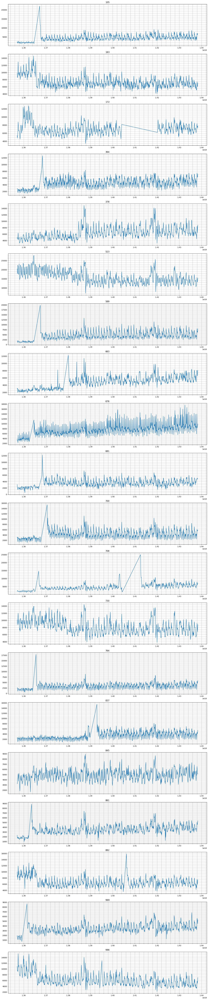

In [26]:
stores_to_check = [105, 163, 172, 364, 378, 523, 589, 663, 676, 681, 
                   700, 708, 730, 764, 837, 845, 861, 882, 969, 986]

plot_sales(stores_to_check, sales, '-')    

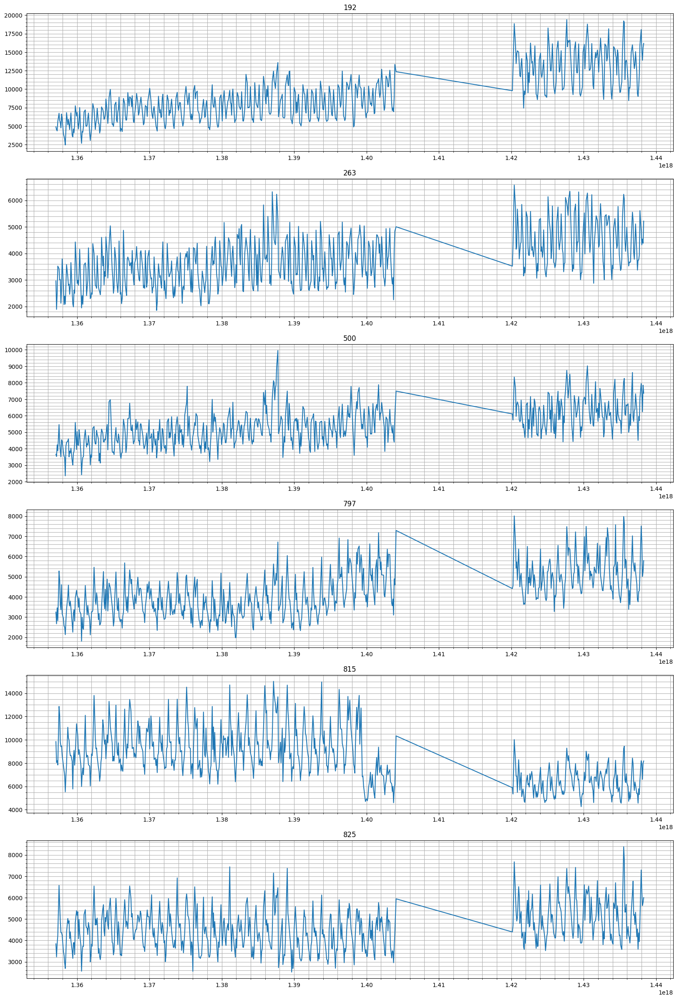

In [27]:
stores_to_check = [192, 263, 500, 797, 815, 825]

plot_sales(stores_to_check, sales, '-')

<br>
Выведем несколько обычных рядов в виде точек

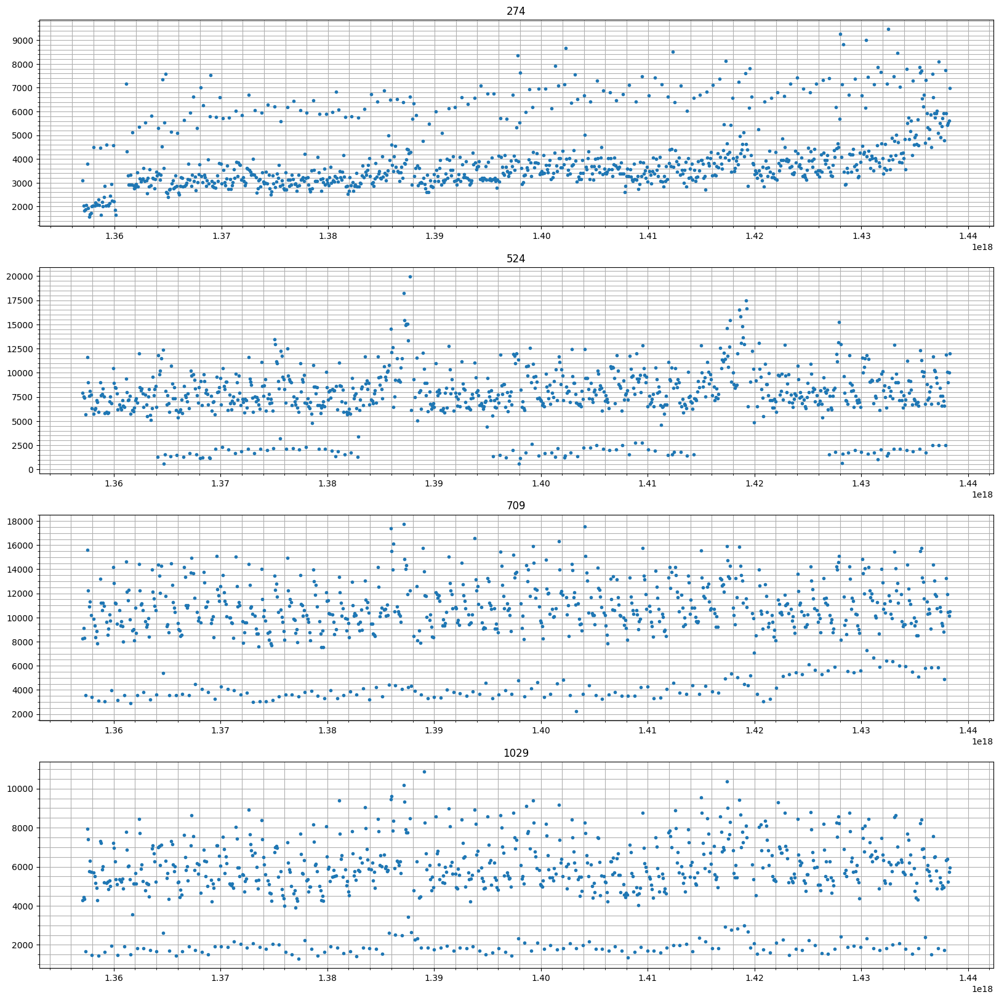

In [28]:
stores_to_check = [274, 524, 709, 1029]

plot_sales(stores_to_check, sales, '.')

<br>
Эти же ряды непрерывно

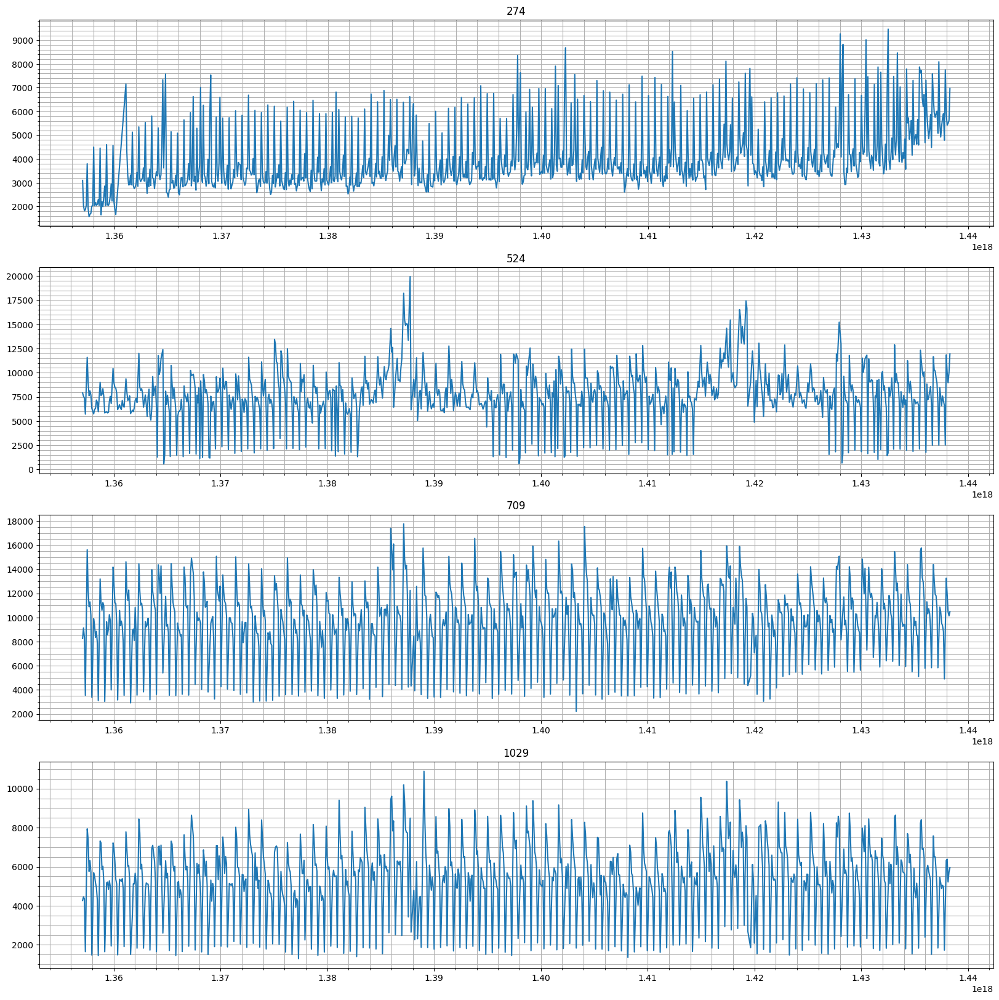

In [29]:
list_stores_to_check = [274, 524, 709, 1029]

plot_sales(stores_to_check, sales, '-')

<br>
Создадим столбец 'Delete' с пометкой на удаление значений ряда с датой меньшей указанной.<br>
Пометка на удаление будет равна True у странных рядов для дат меньших указанных в store_dates_to_remove

In [30]:
# моменты времени для указанных рядов до которых элементы рассматривать не будем

store_dates_to_remove = {   105:1.368e18, 163:1.368e18,
                            172:1.366e18, 364:1.37e18,
                            378:1.39e18, 523:1.39e18,
                            589:1.37e18, 663:1.39e18,
                            676:1.366e18, 681:1.37e18,
                            700:1.373e18, 708:1.368e18,
                            709:1.423e18, 730:1.39e18,
                            764:1.368e18, 837:1.396e18,
                            845:1.368e18, 861:1.368e18,
                            882:1.368e18, 969:1.366e18,
                            986:1.368e18, 192:1.421e18,
                            263:1.421e18, 500:1.421e18,
                            797:1.421e18, 815:1.421e18,
                            825:1.421e18   }

for store, date in store_dates_to_remove.items():
    sales.loc[(sales['Store'] == store) & (sales['DateInt'] < date), 'Delete'] = True

<br>
выведем странные ряды, удаленную часть выделим красным

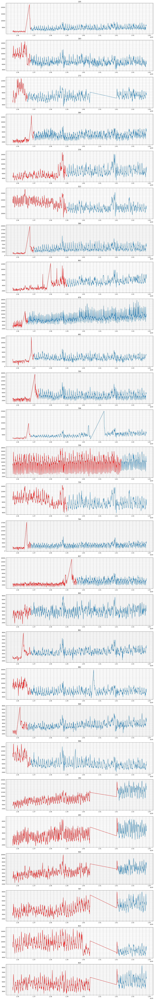

In [31]:
stores_to_check = [105, 163, 172, 364, 378, 523, 589, 663, 676, 681, 700, 708, 709, 
                   730, 764, 837, 845, 861, 882, 969, 986, 192, 263, 500, 797, 815, 825]

fig = plt.figure(figsize=(20, len(stores_to_check) * 5))


for i, store in enumerate(stores_to_check):
    
    cond = (sales['Set'] == 1) & (sales['Store'] == store) & (sales['Open'] == 1)
    cond1 = cond & (sales['Delete'] == True)
    cond2 = cond & (sales['Delete'] != True)

    X1 = sales.loc[cond1]
    y1 = sales.loc[cond1]['Sales']
    
    X2 = sales.loc[cond2]
    y2 = sales.loc[cond2]['Sales']
    
    plt.subplot(len(stores_to_check), 1, i+1)
    plt.plot(X1['DateInt'], y1, 'r-')
    plt.plot(X2['DateInt'], y2, '-')
    plt.minorticks_on()
    plt.grid(True, which='both')
    plt.title(store)


In [32]:
# удалим аномальные данные

sales = sales.loc[sales['Delete'] != True]

<br>
Пометим выбросы в рядах со значением модифицированного z-score >= 3

In [33]:
# метод возвращает true для точек у которых модифицированный z-score больше порога

def mad_based_outlier(points, thresh=3.5):
    if len(points.shape) == 1:
        points = points[:, None]
    
    median = np.median(points, axis=0)
    
    med_abs_deviation = np.median(np.absolute(points - median))

    modified_z_score = 0.6745 * (points - median) / med_abs_deviation

    return modified_z_score > thresh

In [34]:
# для каждого ряда пометим наблюдения-выбросы

for i in sales['Store'].unique():
    cond = (sales['Set'] == 1) & (sales['Store'] == i) & (sales['Open'] == 1)
    sales.loc[cond, 'Outlier'] = mad_based_outlier(sales.loc[cond]['Sales'], 3)

<br>
посмотрим на выбросы первых 10 рядов (магазинов):

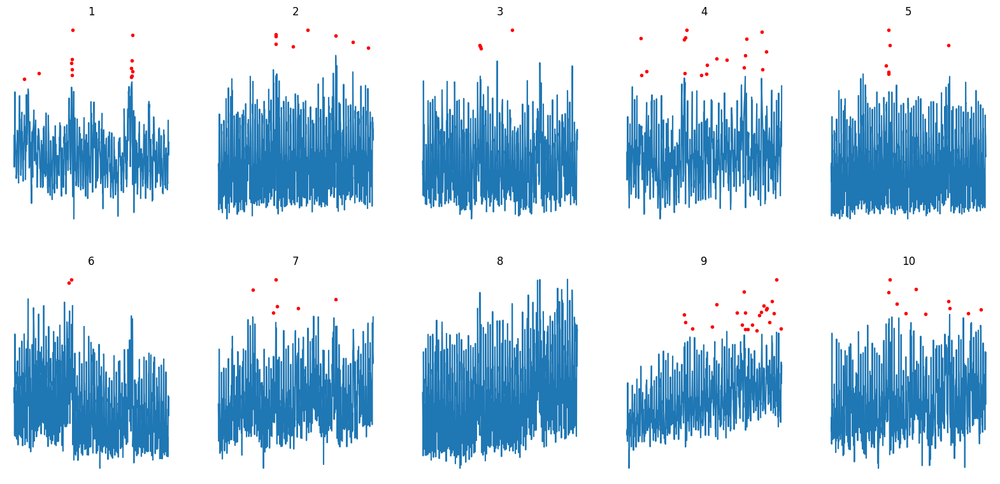

In [35]:
no_stores_to_check = 10

fig = plt.figure(figsize=(20, no_stores_to_check * 5))

for store in range(1, no_stores_to_check + 1):
    
    cond = (sales['Set'] == 1) & (sales['Store'] == store) & (sales['Open'] == 1)
    cond1 = cond & (sales['Outlier'] == False)
    cond2 = cond & (sales['Outlier'] == True)

    # нормальные sales
    X1 = sales.loc[cond1]
    y1 = sales.loc[cond1]['Sales']

    # выбросы
    X2 = sales.loc[cond2]
    y2 = sales.loc[cond2]['Sales']
    
    plt.subplot(10, 5, store)
    plt.plot(X1['Date'], y1, '-')
    plt.plot(X2['Date'], y2, 'r.')
    plt.title(store)
    plt.axis('off')


<br>
Разделим обучающие данные без выбросов на обучающие и проверочные наборы для дальнейшего заполнения выбросов предсказанными моделью xgboost значениями: 

In [36]:
cond = (sales['Set'] == 1) & (sales['Open'] == 1) & (sales['Outlier'] == False)

X_train, X_test, y_train, y_test = train_test_split(sales.loc[cond][features_x],
                                                    sales.loc[cond][features_y],
                                                    test_size = 0.1, 
                                                    random_state = 42)

In [37]:
# есть разные api для обучения xgboost, будем использовать тот, где обучающие данные нужно обернуть в DMatrix

dtrain = xgb.DMatrix(X_train, y_train)
dtest = xgb.DMatrix(X_test, y_test)

evallist = [(dtrain, 'train'), (dtest, 'test')]

In [38]:
num_round = 4000
seed = 42

param = {'bst:max_depth':12,
         'bst:eta':0.01,
         'subsample':0.8,
         'colsample_bytree':0.7,
         'silent':1,
         'objective':'reg:linear',
         'nthread':6,
         'seed':seed}

# параметры:
# subsample – доля обучающей подвыборки одного дерева
# colsample_bytree – доля подмножества колонок для обучения одного дерева
# silent - нужно ли печатать диагностику
# objective - тип задачи и тип модели (reg - задача регрессии, linear - линейная регрессия)
# nthread - количество потоков

# параметры обучения:
# feval - метрика
# verbose_eval - количество шагов бустинга для которых будет выводиться метрика
# early_stopping_rounds - количество шагов бустинга в течении которых если не было ни одного улучшения
#    метрики, то обучение заканчивается
# 2 аргумент - обучающий набор
# 3 аргумент - количество итераций бустинга
# 4 аргумент - валидационный набор


bst = xgb.train(param, dtrain, num_round, evallist, feval=rmspe_xg, verbose_eval=250, early_stopping_rounds=250)


[13:36:49] WARNING: c:\users\dev-admin\croot2\xgboost-split_1675461376218\work\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[13:36:49] WARNING: C:\Users\dev-admin\croot2\xgboost-split_1675461376218\work\src\learner.cc:767: 
Parameters: { "bst:eta", "bst:max_depth", "silent" } are not used.

[0]	train-rmse:5.78740	train-rmspe:0.99682	test-rmse:5.78689	test-rmspe:0.99682
[250]	train-rmse:0.12038	train-rmspe:0.18997	test-rmse:0.12199	test-rmspe:0.13403
[500]	train-rmse:0.10181	train-rmspe:0.14386	test-rmse:0.10508	test-rmspe:0.11613
[750]	train-rmse:0.09423	train-rmspe:0.13299	test-rmse:0.09864	test-rmspe:0.10918
[1000]	train-rmse:0.08978	train-rmspe:0.11953	test-rmse:0.09536	test-rmspe:0.10599
[1250]	train-rmse:0.08653	train-rmspe:0.11162	test-rmse:0.09314	test-rmspe:0.10374
[1500]	train-rmse:0.08423	train-rmspe:0.09979	test-rmse:0.09189	test-rmspe:0.10240
[1750]	train-rmse:0.08218	train-rmspe:0.09315	test-rmse:0.09085	test-rmspe:0.10142

In [39]:
# сделаем предсказания на выбросах и добавим их в данные

cond = (sales['Set'] == 1) & (sales['Open'] == 1) & (sales['Outlier'] == True)

# DMatrix выбросов
dpred = xgb.DMatrix(sales.loc[cond][features_x])

ypred_bst = bst.predict(dpred)

sales.loc[cond, 'SalesLog'] = ypred_bst
sales.loc[cond, 'Sales'] = np.exp(ypred_bst) - 1

<br>
Посмотрим на то какими стали выбросы первых 10 рядов (магазинов).<br>
Видно что точки стали ниже чем раньше.

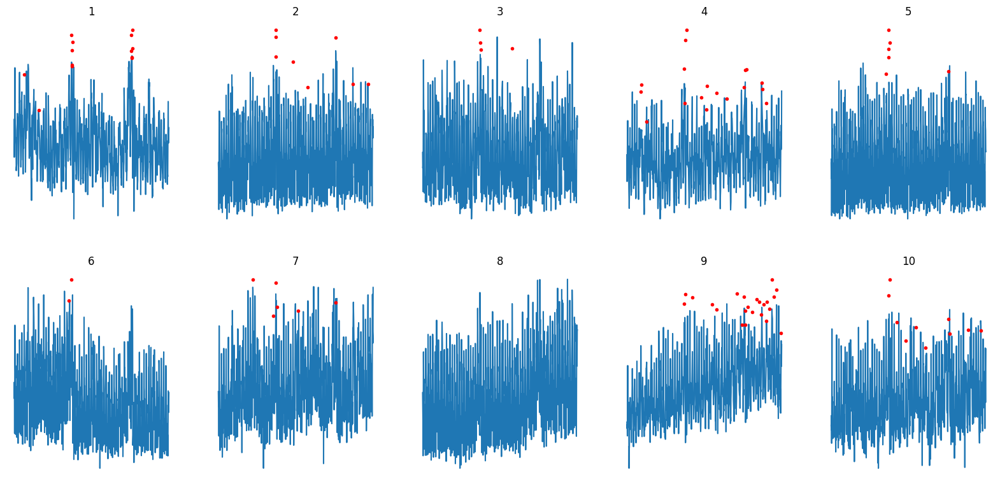

In [40]:
no_stores_to_check = 10

fig = plt.figure(figsize=(20, no_stores_to_check * 5))

for store in range(1,no_stores_to_check+1):
    
    cond = (sales['Set'] == 1) & (sales['Store'] == store) & (sales['Open'] == 1)
    cond1 = cond & (sales['Outlier'] == False)
    cond2 = cond & (sales['Outlier'] == True)

    # нормальные sales
    X1 = sales.loc[cond1]
    y1 = sales.loc[cond1]['Sales']

    # выбросы
    X2 = sales.loc[cond2]
    y2 = sales.loc[cond2]['Sales']
    
    plt.subplot(10, 5, store)
    plt.plot(X1['Date'], y1, '-')
    plt.plot(X2['Date'], y2, 'r.')
    plt.title(store)
    plt.axis('off')
    

In [41]:
sales

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Set,...,DateYear,DateDayOfYear,DateInt,StoreType,Assortment,CompetitionDistance,CompetitionOpenInt,PromoInterval0,Delete,Outlier
0,1,5,2015-07-31,5263.0,555.0,1.0,1,1,1,1,...,2015,212,1438300800000000000,2,0,1270.0,1220227200000000000,-1.0,NaN,False
1,2,5,2015-07-31,6064.0,625.0,1.0,1,1,1,1,...,2015,212,1438300800000000000,0,0,570.0,1193875200000000000,1.0,NaN,False
2,3,5,2015-07-31,8314.0,821.0,1.0,1,1,1,1,...,2015,212,1438300800000000000,0,0,14130.0,1164931200000000000,1.0,NaN,False
3,4,5,2015-07-31,13995.0,1498.0,1.0,1,1,1,1,...,2015,212,1438300800000000000,2,2,620.0,1251763200000000000,-1.0,NaN,False
4,5,5,2015-07-31,4822.0,559.0,1.0,1,1,1,1,...,2015,212,1438300800000000000,0,0,29910.0,1427846400000000000,-1.0,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1058238,1111,6,2015-08-01,NaN,NaN,1.0,0,1,0,0,...,2015,213,1438387200000000000,0,0,1900.0,1401580800000000000,1.0,NaN,NaN
1058239,1112,6,2015-08-01,NaN,NaN,1.0,0,1,0,0,...,2015,213,1438387200000000000,2,2,1880.0,1143849600000000000,-1.0,NaN,NaN
1058240,1113,6,2015-08-01,NaN,NaN,1.0,0,1,0,0,...,2015,213,1438387200000000000,0,2,9260.0,-9223372036854775808,-1.0,NaN,NaN
1058241,1114,6,2015-08-01,NaN,NaN,1.0,0,1,0,0,...,2015,213,1438387200000000000,0,2,870.0,-9223372036854775808,-1.0,NaN,NaN


In [42]:
# Создадим новые признаки: среднее число продаж за день, среднее число посетителей за день, 
# среднее число продаж на 1 посетителя за день для каждого магазина

store_data_sales = sales.groupby([sales['Store']])['Sales'].sum()
store_data_customers = sales.groupby([sales['Store']])['Customers'].sum()
store_data_open = sales.groupby([sales['Store']])['Open'].count()

store_data_sales_per_day = store_data_sales / store_data_open
store_data_customers_per_day = store_data_customers / store_data_open
store_data_sales_per_customer_per_day = store_data_sales_per_day / store_data_customers_per_day

stores = pd.merge(stores, store_data_sales_per_day.reset_index(name='SalesPerDay'), 
                  how='left', on=['Store'])
stores = pd.merge(stores, store_data_customers_per_day.reset_index(name='CustomersPerDay'), 
                  how='left', on=['Store'])
stores = pd.merge(stores, store_data_sales_per_customer_per_day.reset_index(name='SalesPerCustomersPerDay'), 
                  how='left', on=['Store'])

In [43]:
# добавим полученные признаки в features_x

store_features = ['Store', 'SalesPerDay', 'CustomersPerDay', 'SalesPerCustomersPerDay']

features_x = list(set(features_x + store_features))

sales = pd.merge(sales, stores[store_features], how='left', on=['Store'])

<br>

### Обучение и прогнозирование
<br>

Короткие ряды - [192, 263, 500, 797, 815, 825]

**модели** - две модели XGBoost, для обычных и коротких рядов.

1-я модель обучается на всех рядах кроме коротких.<br>
2-я модель обучается на всех рядах (короткие просемплированы).

**признаки модели**:
- 'Store', 'DayOfWeek', 'Open', 'Promo', 'SchoolHoliday', 'StateHoliday'
- номер дня, недели, месяца, года, дня года
- среднее число продаж за день, среднее число посетителей за день, среднее число продаж на 1 посетителя за день

In [44]:
# Разделим обучающие данные на обучающие и проверочные наборы:

cond = (sales['Set'] == 1) & (sales['Open'] == 1) & (~sales['Store'].isin([192, 263, 500, 709, 797, 815, 825, 837]))

X_train, X_test, y_train, y_test = train_test_split(sales.loc[cond][features_x],
                                                    sales.loc[cond][features_y],
                                                    test_size=0.1, random_state=42)

dtrain = xgb.DMatrix(X_train, y_train)
dtest = xgb.DMatrix(X_test, y_test)

evallist = [(dtrain, 'train'), (dtest, 'test')]

In [45]:
num_round = 4000
seed = 42

param = {'bst:max_depth':12,
         'bst:eta':0.0095,
         'subsample':0.8,
         'colsample_bytree':0.7,
         'silent':1, 
         'objective':'reg:linear',
         'nthread':6,
         'seed':seed}

# параметры:
# subsample – доля обучающей подвыборки одного дерева
# colsample_bytree – доля подмножества колонок для обучения одного дерева
# silent - нужно ли печатать диагностику
# objective - тип задачи и тип модели (reg - задача регрессии, linear - линейная регрессия)
# nthread - количество потоков

# параметры обучения:
# feval - метрика
# verbose_eval - количество шагов бустинга для которых будет выводиться метрика
# early_stopping_rounds - количество шагов бустинга в течении которых если не было ни одного улучшения
#    метрики, то обучение заканчивается
# 2 аргумент - обучающий набор
# 3 аргумент - количество итераций бустинга
# 4 аргумент - валидационный набор


bst = xgb.train(param, dtrain, num_round, evallist, feval=rmspe_xg, verbose_eval=250, early_stopping_rounds=250)


[13:50:29] WARNING: c:\users\dev-admin\croot2\xgboost-split_1675461376218\work\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[13:50:29] WARNING: C:\Users\dev-admin\croot2\xgboost-split_1675461376218\work\src\learner.cc:767: 
Parameters: { "bst:eta", "bst:max_depth", "silent" } are not used.

[0]	train-rmse:5.78951	train-rmspe:0.99691	test-rmse:5.79094	test-rmspe:0.99691
[250]	train-rmse:0.10429	train-rmspe:0.17207	test-rmse:0.10657	test-rmspe:0.11754
[500]	train-rmse:0.09371	train-rmspe:0.16117	test-rmse:0.09732	test-rmspe:0.10804
[750]	train-rmse:0.08847	train-rmspe:0.15071	test-rmse:0.09335	test-rmspe:0.10402
[1000]	train-rmse:0.08495	train-rmspe:0.11152	test-rmse:0.09104	test-rmspe:0.10144
[1250]	train-rmse:0.08240	train-rmspe:0.10778	test-rmse:0.08958	test-rmspe:0.10001
[1500]	train-rmse:0.08040	train-rmspe:0.10357	test-rmse:0.08858	test-rmspe:0.09895
[1750]	train-rmse:0.07880	train-rmspe:0.09403	test-rmse:0.08789	test-rmspe:0.09834

<br>
просемплируем короткие ряды:

In [46]:
shortset = sales[sales['Store'].isin([192, 263, 500, 709, 797, 815, 825, 837])]
shortset_repeated = pd.concat([shortset, shortset, shortset, shortset])
sales_sampled = pd.concat([sales, shortset_repeated])

In [49]:
cond = (sales_sampled['Set'] == 1) & (sales_sampled['Open'] == 1)

X_train, X_test, y_train, y_test = train_test_split(sales_sampled.loc[cond][features_x],
                                                    sales_sampled.loc[cond][features_y],
                                                    test_size=0.1, random_state=42)

dtrain = xgb.DMatrix(X_train, y_train)
dtest = xgb.DMatrix(X_test, y_test)

evallist = [(dtrain, 'train'), (dtest, 'test')]

In [50]:
num_round = 4000
seed = 42

param = {'bst:max_depth':12,
         'bst:eta':0.0095,
         'subsample':0.8,
         'colsample_bytree':0.7,
         'silent':1, 
         'objective':'reg:linear',
         'nthread':6,
         'seed':seed}

# параметры:
# subsample – доля обучающей подвыборки одного дерева
# colsample_bytree – доля подмножества колонок для обучения одного дерева
# silent - нужно ли печатать диагностику
# objective - тип задачи и тип модели (reg - задача регрессии, linear - линейная регрессия)
# nthread - количество потоков

# параметры обучения:
# feval - метрика
# verbose_eval - количество шагов бустинга для которых будет выводиться метрика
# early_stopping_rounds - количество шагов бустинга в течении которых если не было ни одного улучшения
#    метрики, то обучение заканчивается
# 2 аргумент - обучающий набор
# 3 аргумент - количество итераций бустинга
# 4 аргумент - валидационный набор


bst_short = xgb.train(param, dtrain, num_round, evallist, feval=rmspe_xg, verbose_eval=250, early_stopping_rounds=250)


[14:06:27] WARNING: c:\users\dev-admin\croot2\xgboost-split_1675461376218\work\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.
[14:06:27] WARNING: C:\Users\dev-admin\croot2\xgboost-split_1675461376218\work\src\learner.cc:767: 
Parameters: { "bst:eta", "bst:max_depth", "silent" } are not used.

[0]	train-rmse:5.78908	train-rmspe:0.99690	test-rmse:5.78855	test-rmspe:0.99690
[250]	train-rmse:0.10486	train-rmspe:0.15823	test-rmse:0.10670	test-rmspe:0.12116
[500]	train-rmse:0.09398	train-rmspe:0.13112	test-rmse:0.09724	test-rmspe:0.11111
[750]	train-rmse:0.08863	train-rmspe:0.12287	test-rmse:0.09317	test-rmspe:0.10688
[1000]	train-rmse:0.08506	train-rmspe:0.10566	test-rmse:0.09077	test-rmspe:0.10386
[1250]	train-rmse:0.08238	train-rmspe:0.10172	test-rmse:0.08930	test-rmspe:0.10237
[1500]	train-rmse:0.08034	train-rmspe:0.09507	test-rmse:0.08832	test-rmspe:0.10130
[1750]	train-rmse:0.07873	train-rmspe:0.09094	test-rmse:0.08768	test-rmspe:0.10046

<br>
Прогнозирование и экспорт:

In [57]:
short_sales = [192, 263, 500, 709, 797, 815, 825, 837]


# предсказания для обычных рядов

X_submit = sales.loc[(sales['Set'] == 0) & (~sales['Store'].isin(short_sales))]
dX_submit = xgb.DMatrix(X_submit[features_x])

preds = bst.predict(dX_submit)

# преобразуем столбец Id в DataFrame
df_pred = X_submit['Id'].reset_index()
del df_pred['index']
df_pred['Id'] = df_pred['Id'].astype('int')

# возведение в экспоненту (умножение на 0.985 улучшает качество прогнозов)
df_pred['Sales'] = (np.exp(preds) - 1) * 0.985


# предсказания для коротких рядов

X_submit = sales.loc[(sales['Set'] == 0) & (sales['Store'].isin(short_sales))]
dX_submit = xgb.DMatrix(X_submit[features_x])

preds = bst_short.predict(dX_submit)

# преобразуем столбец Id в DataFrame
df_pred_short = X_submit['Id'].reset_index()
del df_pred_short['index']
df_pred_short['Id'] = df_pred_short['Id'].astype('int')

# возведение в экспоненту (умножение на 0.985 улучшает качество прогнозов)
df_pred_short['Sales'] = (np.exp(preds) - 1) * 0.985


# экспорт прогнозов

df_pred_submit = pd.concat([df_pred, df_pred_short])
df_pred_submit.sort_values('Id', inplace=True)
df_pred_submit[['Id', 'Sales']].to_csv('rossmann_best_no_ext_data_scaled.csv', index=False)